# GRO620 - Problématique

Voici le fichier de départ de la problématique. Si tout a été installé correctement, vous devriez voir apparaître la première image (DSCF8010.jpeg).

In [15]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

print("GRO620 - Problématique")
print("OpenCV version", cv2.__version__)

%matplotlib inline

GRO620 - Problématique
OpenCV version 4.8.0


In [16]:
images_fn = os.listdir("photos_prob/")
print("%i photo(s) à traiter"%(len(images_fn)))
if (len(images_fn) == 0):
    print("ERREUR! Vérifiez que vous avez bien un dossier photos_prob au même endroit que ce calepin.")
    
images = []

for f in images_fn:
    img = cv2.imread(os.path.join("photos_prob/", f))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    images.append(img)

9 photo(s) à traiter


## Affichage des images à traiter :

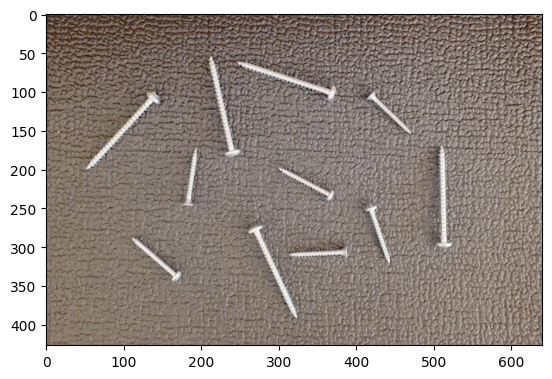

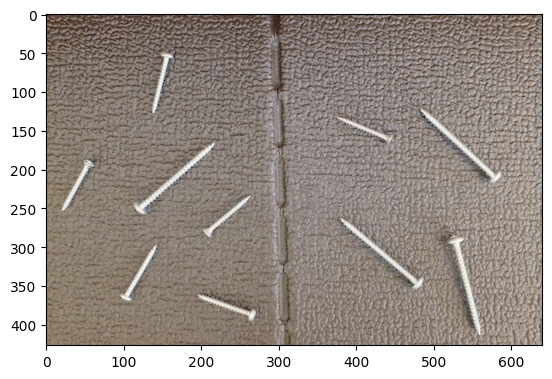

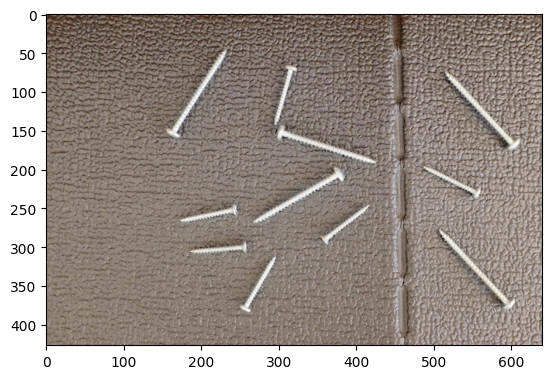

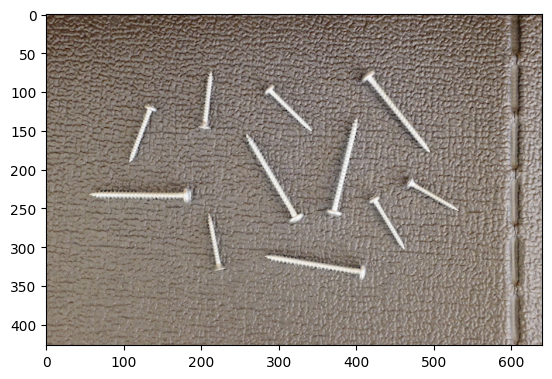

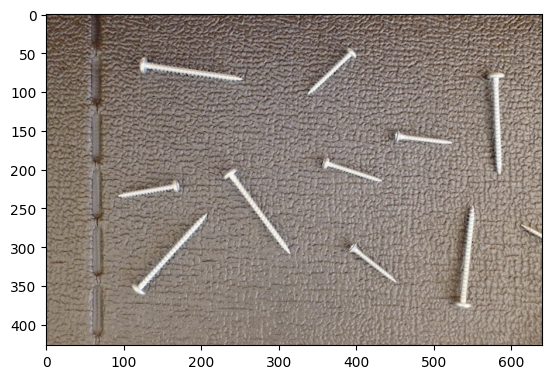

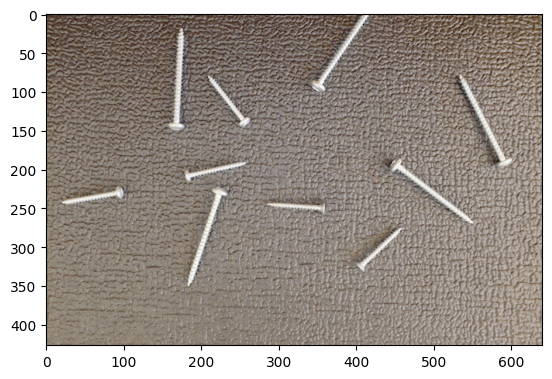

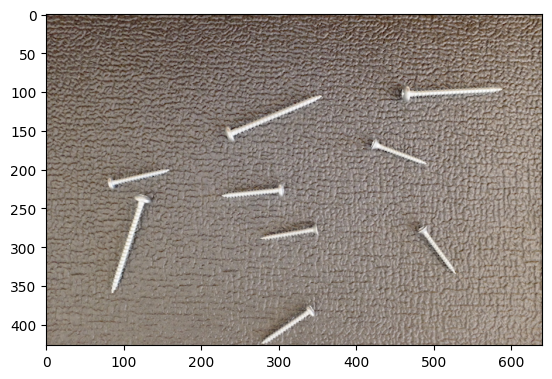

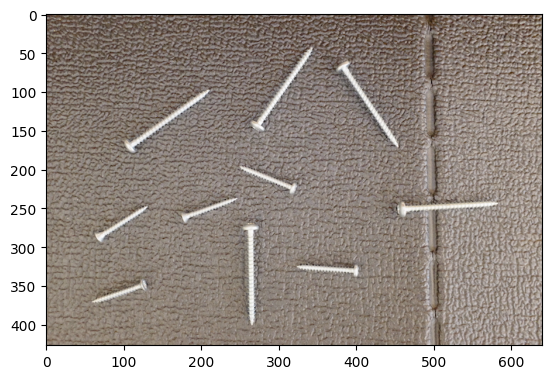

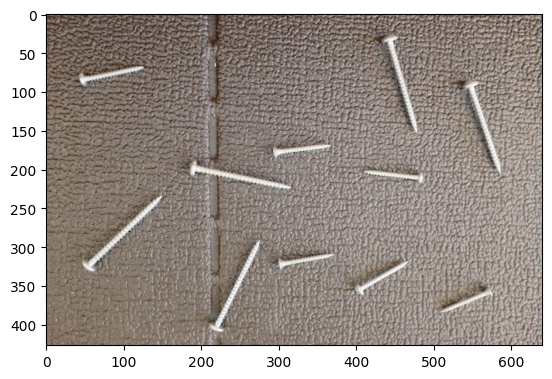

In [17]:
for image in images:
    plt.figure()
    plt.imshow(image)

# Identification du problème :
La tâche que nous avons à accomplir pour l'entreprise est de classifier les vis sur le convoyeur entre longue et courte et de localiser le centre de la vis avec son angle d'inclinaison entre 0 et 180 degrés, puisque l'on ne considère pas l'orientation de sa tête, et terminer en convertissant la position en pixels par rapport à la caméra en position en mètres par rapport au convoyeur. De plus, puisque les vis sont sur un convoyeur qui passe de gauche à droite, si une vis est coupée dans l'image soit à gauche ou à droite, il faut l'éliminer puisque nous aurons une meilleure vue au fur et à mesure que le convoyeur avance. Par contre, si la vis est coupée en haut ou en bas, il faut la considérer parce que nous n'aurons pas une meilleure vue sur la vis au fur et à mesure que le convoyeur avance. Voici une image du montage de la caméra et du convoyeur :

![](images_doc/prob_montage.PNG)

## Caractéristiques de l'image :
Dans les images précédentes, on peut remarquer que la couleur des vis sont de couleur argent alors que la couleur du tapis du convoyeur est brun. On peut aussi facilement établir la différence entre les vis longues qui sont 2 fois plus grande que les vis courtes. On peut aussi voir que le convoyeur à des intersections verticale en forme de petits rectangles qui pourrait nous causer problème en créant des réflexions spéculaires indésirables.

### Histogramme de couleur des images :
Afin de mieux observer la gamme de couleurs de l'image pour mieux choisir notre filtre, nous avons décidé de faire un histogramme de couleur pour chaque image. Nous avons choisi de faire un histogramme de couleur en HSV puisque nous savons que la couleur des vis est de couleur argent et que nous pouvons facilement la filtrer en HSV. De plus, nous avons aussi choisi de faire un histogramme de couleur pour chaque image afin de voir si la couleur des vis est toujours la même.

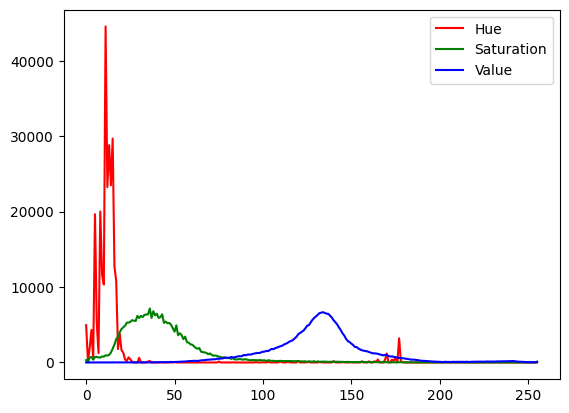

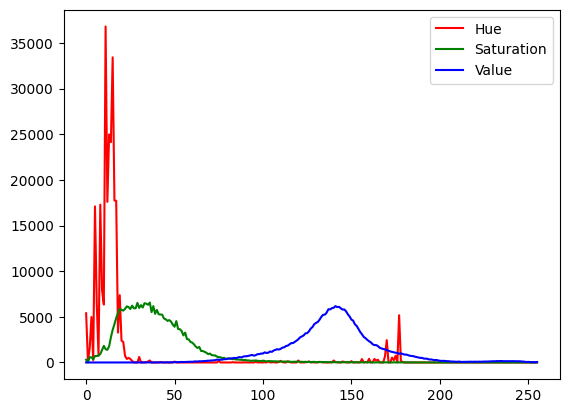

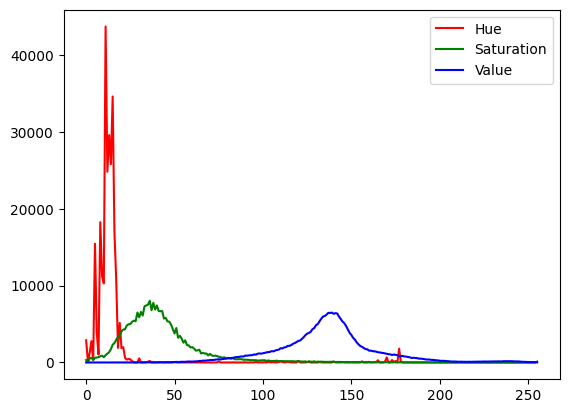

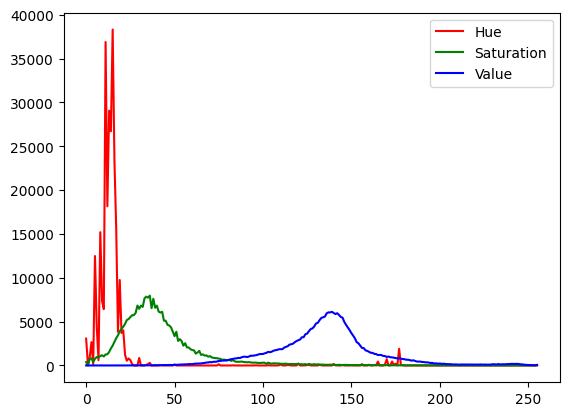

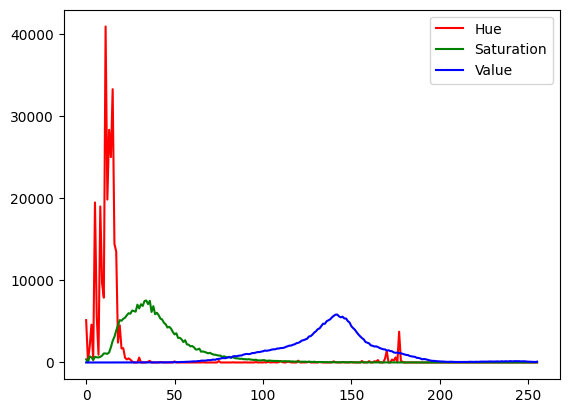

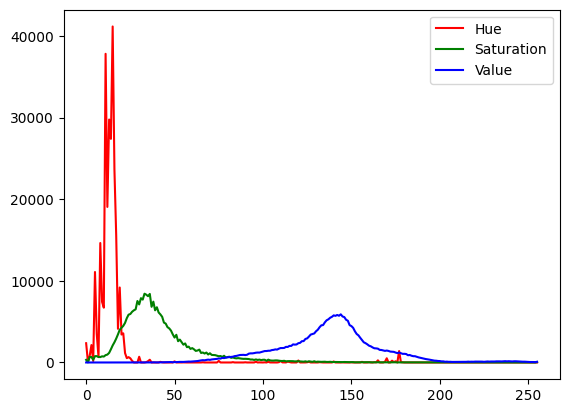

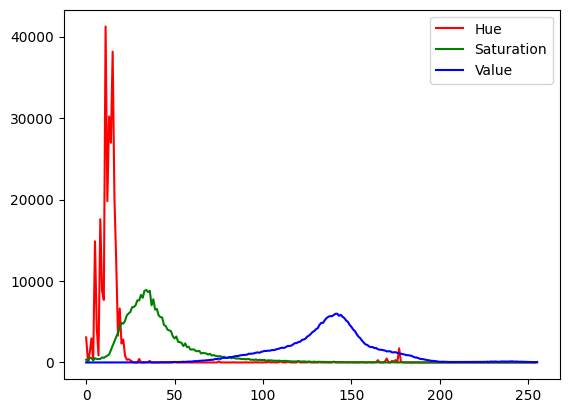

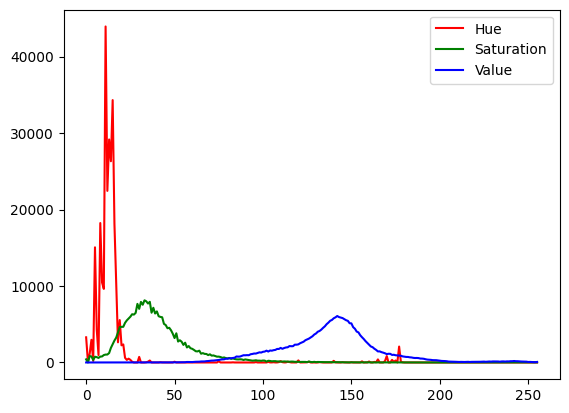

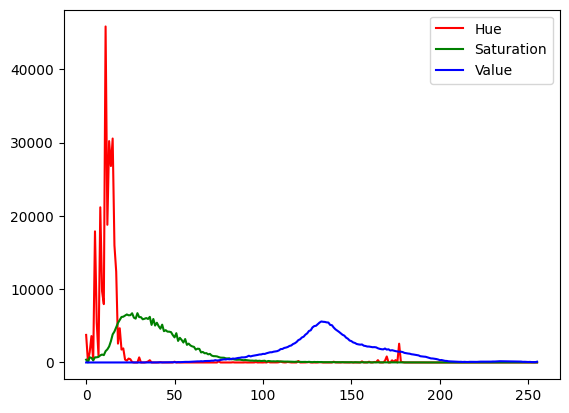

In [18]:
for image in images:
    image_copy = image.copy()
    image_copy = cv2.cvtColor(image_copy, cv2.COLOR_RGB2HSV)
    plt.figure()
    hist_hue = cv2.calcHist([image_copy], [0], None, [256], [0, 256])
    hist_sat = cv2.calcHist([image_copy], [1], None, [256], [0, 256])
    hist_val = cv2.calcHist([image_copy], [2], None, [256], [0, 256])
    plt.plot(hist_hue, color='r')
    plt.plot(hist_sat, color='g')
    plt.plot(hist_val, color='b')
    plt.legend(['Hue', 'Saturation', 'Value'])

### Description de l'histogramme :
Avec ses histogrammes, nous pouvons remarquer que le Hue se retrouve avec un pic important entre 0 et 20 et entre 160 et 180. La Saturation se retrouve avec un pic important entre 0 et 80. La Value se retrouve avec un pic important entre 100 et 200. Avec cet historigramme, nous voulons isoler la couleur argent des vis en filtrant la couleur argent en HSV. Voici un graphique de la couleur HSV :
![](images_doc/HSV_color_solid_cylinder_saturation_gray.png)


# 1. Traitement des images pour isoler les pixels appartenant à des vis dans les images :

## 1.1 Filtrage des images :
Afin d'éliminer la rugosité du convoyeur et les réflexions spéculaires, nous avons décidé d'utiliser un filtre médian bilatéral pour garder les contours des vis sans trop les brouillées. Pour bien choisir ses paramètres, nous savions que nous voulions bien retirer la rugosité du convoyeur tout en gardant le contraste entre les vis et le convoyeur. Nous avons donc choisi une taille de fenêtre de 9 afin de bien éliminer les rugositées du convoyeur tout en gardant les petites vis lors du filtrage. pour le sigma space et le sigma color, nous avons choisi 75 pour les deux afin de garder le contraste entre les vis et le convoyeur.
Nous avons aussi décidé de convertir l'image en HSV pour filtrer la couleur argent des vis selon l'histogramme plus haut. De cette façon, nous obtenons un masque en noir et blanc qui nous permet de bien voir les vis filtrées du bruit apporté par les rugositées du convoyeur. Ce filtrage de couleur est accompli à l'aide de la fonction inRange de OpenCV. Ses paramètres sont les valeurs minimales et maximales de la couleur à filtrer en HSV qui dans notre cas est la couleur argent qui se situe au centre du cylindre hsv entre 0 et 80 de saturation sur toute la plage de couleur soit de 0 à 255 et à de haute value de 200 à 255. (Voir l'image ci-haut pour avoir une idée de la couleur argent en HSV)

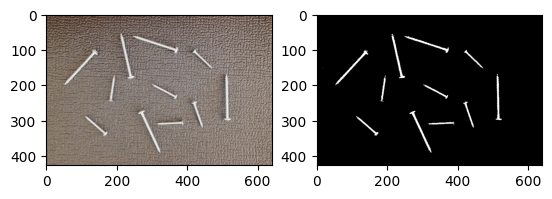

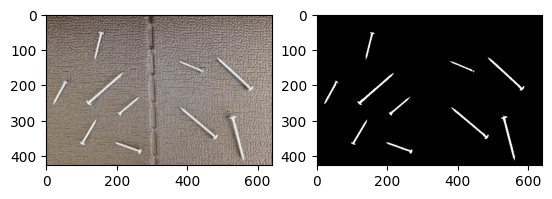

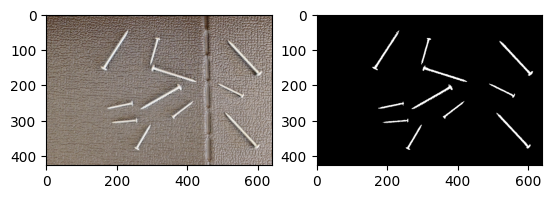

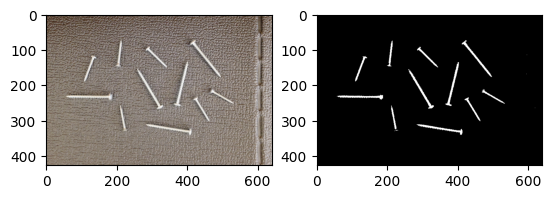

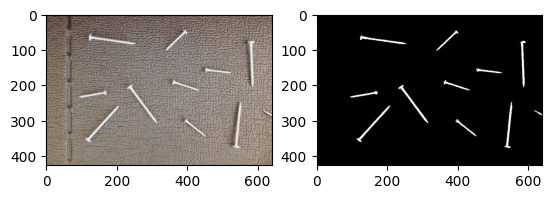

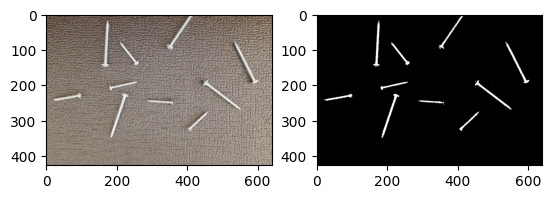

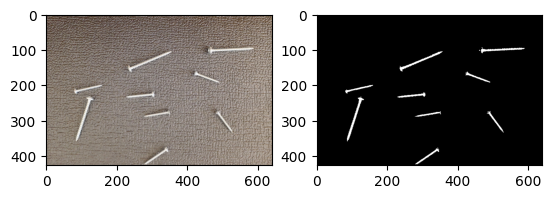

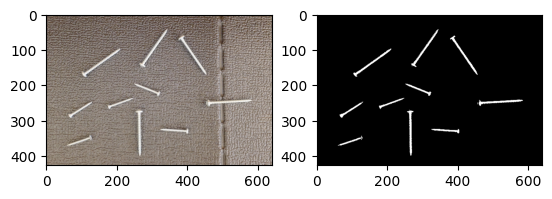

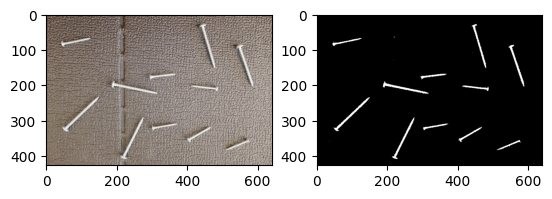

In [19]:
images_filt = []
for image in images:
    image_copy = image.copy()
    # Filtre median bilatéral :
    image_copy = cv2.bilateralFilter(image_copy, 9, 75, 75)
    # Conversion en HSV :
    image_copy = cv2.cvtColor(image_copy, cv2.COLOR_RGB2HSV)
    # Filtrage de la couleur argent :
    mask = cv2.inRange(image_copy, (0, 0, 200), (255, 80, 255))
    images_filt.append(mask)
# Affichage des images filtrées :
i = 0
for image in images_filt:
    plt.figure()
    plt.subplot(1,2,1)
    plt.imshow(images[i], cmap="gray")
    plt.subplot(1,2,2)
    plt.imshow(image, cmap="gray")
    i += 1


## 1.2 Trouver les contours :
Pour obtenir les contours des vis, nous avons utilisé la fonction findContours de OpenCV qui détecte un changement de couleur dans l'image et en ressort les intersection. Nous avons choisi de prendre le mode RETR_EXTERNAL puisque nous considérons seulement les contours externes des vis. Nous avons aussi choisi de prendre le mode CHAIN_APPROX_NONE pour avoir tous les points des contours afin de mieux définir le contour des vis et que nous n'avons pas de limite d'espace pour le système qui roulera notre algorithme. Afin de représenter les contours dans l'image, nous avons utilisé la fonction drawContours de OpenCV. La fonction cv2.drawContours nous permet d’afficher les contours de la forme exacte des vis. L’argument -1 permet de dessiner tous les contours du tableau de la variable contours. Finalement, les deux autres paramètres permettent de choisir la couleur et l’épaisseur des contours dessinés.

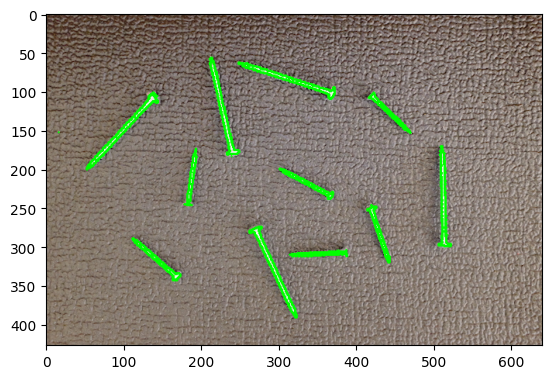

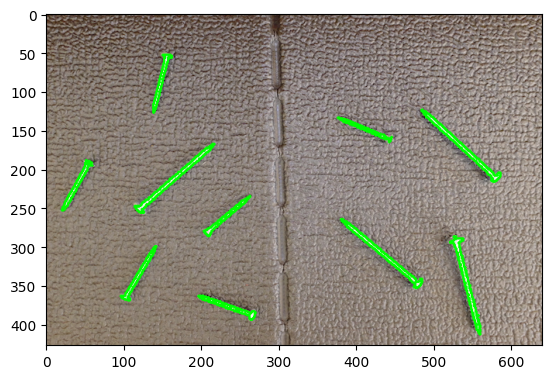

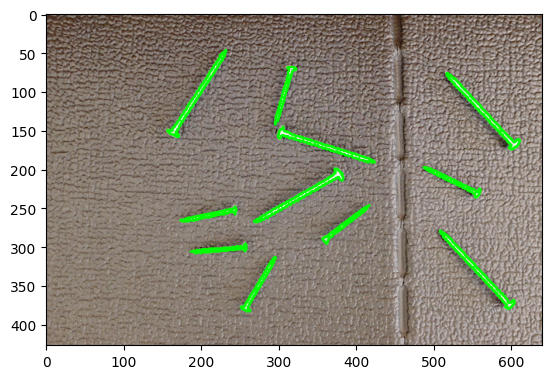

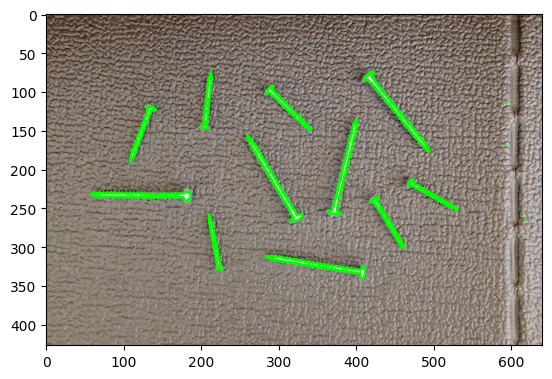

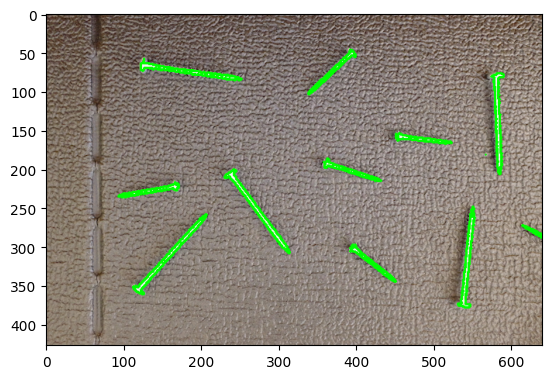

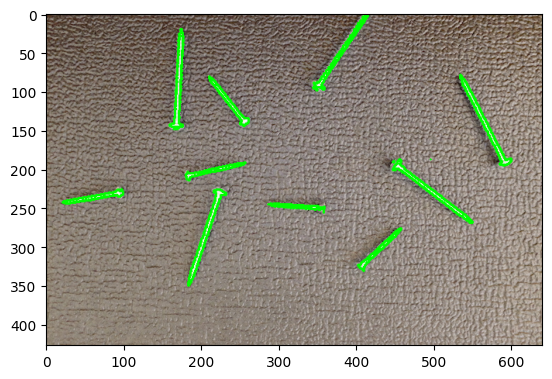

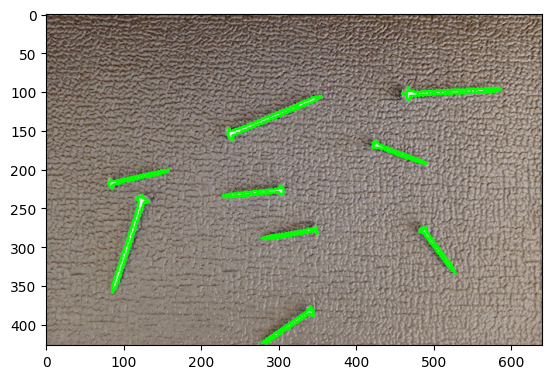

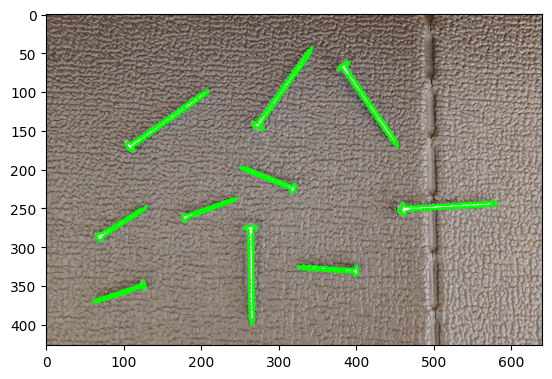

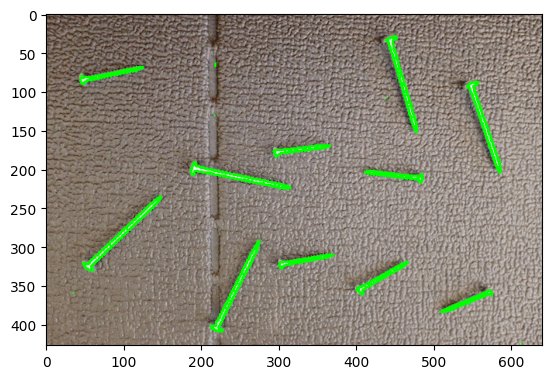

In [20]:
images_contours = []
images_contours_draw = images.copy()

for image in images_filt:
    contours, hierarchy = cv2.findContours(image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    images_contours.append(contours)
# Affichage des contours :
i = 0
for image, contours in zip(images, images_contours):
    image_contours_draw = image.copy()
    images_contours_draw.append(image_contours_draw)
    cv2.drawContours(image_contours_draw, contours, -1, (0, 255, 0), 2)
    plt.figure()
    plt.imshow(image_contours_draw)
    i += 1


## 1.3. Trouver les boîtes englobantes et leurs point milieu :
Une fois les contours trouvés, nous avons utilisé la fonction minAreaRect de OpenCV pour trouver les boîtes englobantes des vis. Cette fonction nous permet de garder l'orientation de la vis avec la boite englobante au lieu d'avoir une boite englobante trop grande et que son centre ne soit pas le bon. Ensuite, avons utilisé la fonction boxPoints pour trouver les points des boîtes englobantes afin de les dessiner sur l'image. Nous avons par la suite utilisé la fonction fitLine de OpenCV pour trouver l'angle des vis avec les contours puisque l'angle donné par minAreaRect se situe entre 0 et 90 degrées peu importe l'orientation de la boite. Dans ses paramètres, on y retrouve cv2.DIST_L2 qui est la façon la plus simple et plus rapide pour faire la méthode des moindres carrés et retrouver la ligne de la vis. Pour finir, nous avons utilisé la fonction circle de OpenCV pour dessiner les points milieu sur l'image. Le tout est fait en considérant l'aire des boites englobantes plus grandes que 50 pour éliminer les boites englobantes trop petites en raison du bruit qui pourrait rester dans le masque. Finalement, en faisant le traitement de chaque vis, nous pouvons ressortir l’angle par rapport à l’axe X et la longueur de chaque vis. Ainsi, les paramètres de chaque vis pour chaque image sont emmagasinés dans un dictionnaire nommé screw_properties.

C:\Users\alexd\AppData\Local\Temp\ipykernel_46316\1252634354.py:38: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print("Point milieu : (%i, %i), angle : %f, longueur :%s" %(xy_center[0], xy_center[1], angle, vis_type))
C:\Users\alexd\AppData\Local\Temp\ipykernel_46316\1252634354.py:45: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  screws.append((np.array([xy_center[0], xy_center[1], z]), float(angle), vis_type))


Point milieu : (351, 310), angle : 2.157135, longueur :courte
Point milieu : (139, 316), angle : 138.923370, longueur :courte
Point milieu : (298, 332), angle : 115.004646, longueur :longue
Point milieu : (432, 283), angle : 108.358917, longueur :courte
Point milieu : (334, 218), angle : 152.416565, longueur :courte
Point milieu : (188, 213), angle : 82.087425, longueur :courte
Point milieu : (514, 237), angle : 91.443184, longueur :longue
Point milieu : (445, 127), angle : 136.182800, longueur :courte
Point milieu : (96, 151), angle : 47.268112, longueur :longue
Point milieu : (309, 85), angle : 162.127319, longueur :longue
Point milieu : (229, 117), angle : 102.883430, longueur :longue
Point milieu : (233, 374), angle : 160.190567, longueur :courte
Point milieu : (122, 334), angle : 59.456436, longueur :courte
Point milieu : (547, 350), angle : 104.133896, longueur :longue
Point milieu : (429, 308), angle : 140.168015, longueur :longue
Point milieu : (235, 260), angle : 40.343353, lo

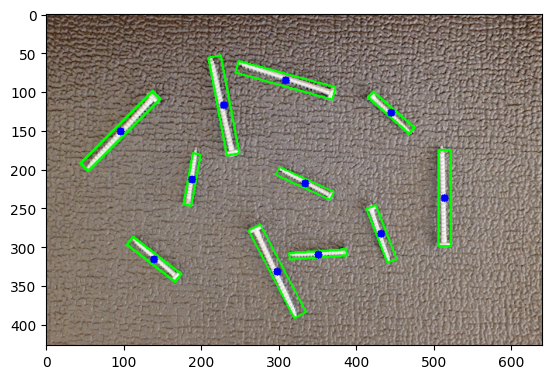

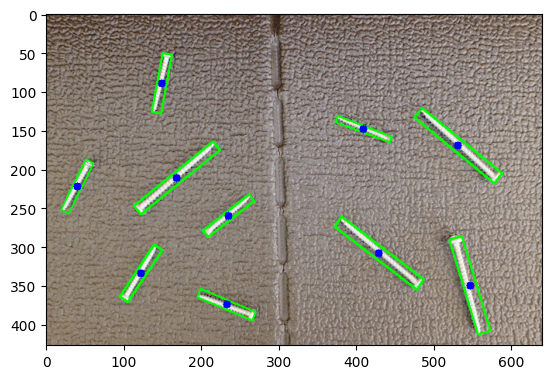

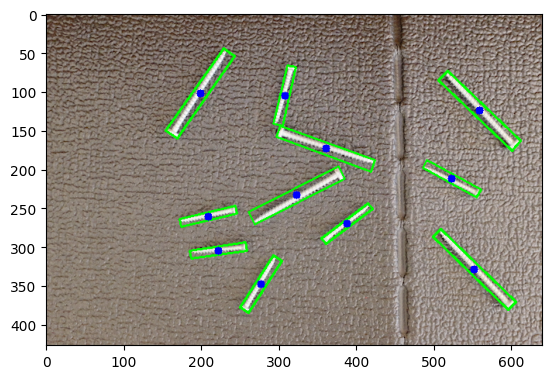

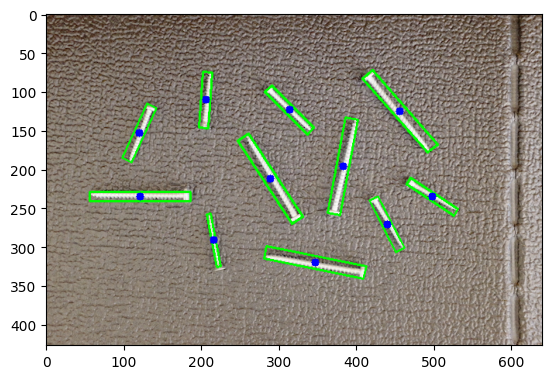

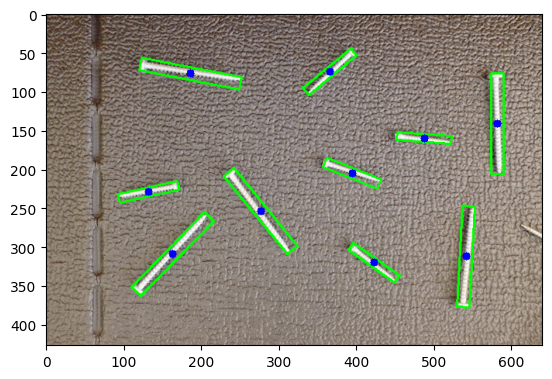

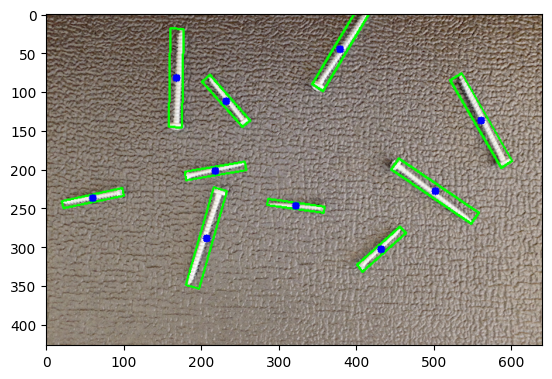

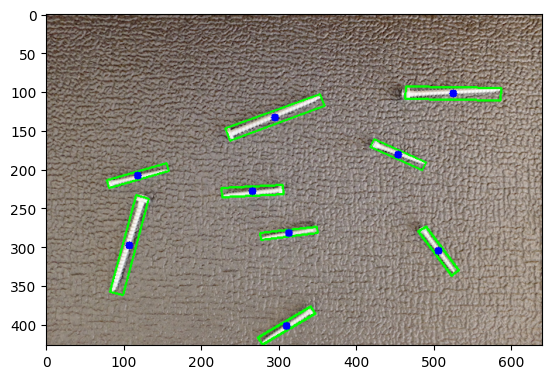

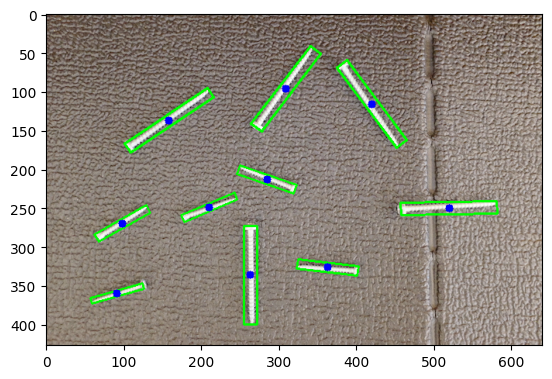

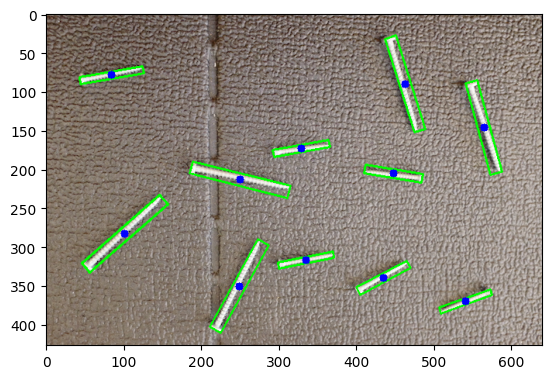

In [21]:
images_bbox = []
screw_properties = dict()  # Dictionnaire pour stocker les propriétés des vis selon le numéro de l'image
image_index = 0
for image, contours in zip(images, images_contours):
    image_bbox = image.copy()
    images_bbox.append(image_bbox)
    screws = []
    for contour in contours:
        # Trouver les boîtes englobantes avec les contours :
        xy_center, wh, angle = cv2.minAreaRect(contour)
        rect = cv2.minAreaRect(contour)
        # Trouver les points des boîtes englobantes :
        box = cv2.boxPoints(rect)
        box = np.intp(box)

        # Calculs des propriétés des vis :
        if wh[0]*wh[1] > 50 and 620 > xy_center[0] > 20:  # On ignore les boîtes trop petites et les boîtes trop à gauche ou à droite
            # Calcul de l'angle :
            rows,cols = image_bbox.shape[:2]
            [vx,vy,x,y] = cv2.fitLine(contour, cv2.DIST_L2,0,0.01,0.01)
            angle_rad = np.arctan2(vy, vx)
            angle = np.degrees(angle_rad)

            # S'assurer que l'angle est entre 0 et 180 degrés :
            if angle < 0:
                angle += 180
            angle = 180 - angle # On veut l'angle par rapport à l'axe vertical

            # Calcul de la longueur de la vis (Classification):
            longueur = max(wh)
            vis_type = "None"
            if longueur < 100:
                vis_type = "courte"
            else:
                vis_type = "longue"

            #Affichage du point milieu et de l'angle :
            print("Point milieu : (%i, %i), angle : %f, longueur :%s" %(xy_center[0], xy_center[1], angle, vis_type))
            # Dessiner les boîtes englobantes et les points milieu :
            cv2.drawContours(image_bbox, [box], 0, (0, 255, 0), 2)
            cv2.circle(image_bbox, (int(xy_center[0]), int(xy_center[1])), 5, (0, 0, 255), -1)

            # Ajout des propriétés de la vis dans le dictionnaire :
            z = 0.0
            screws.append((np.array([xy_center[0], xy_center[1], z]), float(angle), vis_type))
    screw_properties[image_index] = screws
    image_index += 1
# Affichage des images avec les boîtes englobantes :
for image in images_bbox:
    plt.figure()
    plt.imshow(image)


# 2. Conversion des coordonnées des vis de pixels à métrique :
Afin d'obtenir les coordonnées des vis en mètres par rapport au convoyeur, nous avons utilisé les informations intrinsèques de la caméra ainsi que la matrice de transformation du repère de la caméra jusqu'au repère du convoyeur comme dans l'image ci-dessous :
![](images_doc/Repere.PNG)
Avec les informations intrinsèques de la caméra, nous pouvons générer la matrice de calibration K avec des calculs pour trouver la distance focale en pixels. Nous pouvons par la suite trouver la matrice de calibration augmenter pour générer la matrice de projection P. Cette matrice de projection nous permet de passer du repère de la caméra en métrique jusqu'au repère du convoyeur en pixels, mais nous voulons l'inverse alors avec la matrice de projection inverse, nous pouvons trouver les coordonnées des vis en mètres par rapport au convoyeur à partir des coordonnées en pixels de la caméra.

In [22]:
# Propriétés de la caméra :
Resolution = [640, 427] # pixels
distances_focales = [23/1000] # m
Capteur = [23.4/1000, 15.6/1000] # m

# Calculs des paramètres de la caméra :
facteur = Capteur[0] / Resolution[0]  # m/pixel
dfpx = distances_focales[0] / facteur  # pixels

# Matrice de calibration :
k = np.array([[dfpx, 0., Resolution[0]/2],
              [0.,dfpx, Resolution[1]/2],
              [0., 0., 1.]])

# Matrice de calibration augmentée :
k_augm = np.zeros((4,4)) # On initialise une matrice vide 4x4 pour construire K tilde (eq. 2.64)
k_augm[0:3,0:3] = k      # Le premier carré 3x3 correspond à K
k_augm[3,3] = 1
print(k_augm)

# Matrice de transformation de la caméra au convoyeur :
Tcam = np.array([[1., 0., 0., 0.5],
                [0.,-1., 0., 0.2],
                [0., 0., -1, 0.282],
                [0., 0., 0., 1.]])

# Matrice de projection :
pt = np.matmul(k_augm, np.linalg.inv(Tcam))
print(pt)
pt_inv = np.linalg.inv(pt)
print(pt_inv)
d = 1.0/Tcam[2,3] # 1 / z, et z est la distance entre la caméra et le convoyeur


screws_metrique = dict()

for image_index in range(len(images)):
    screws_list_metrique = []
    for screw in screw_properties[image_index]:
        screw_vector = np.array([screw[0][0], screw[0][1], 1, d]) / d
        screw_vector = np.matmul(pt_inv, screw_vector)
        screws_list_metrique.append((np.array([screw_vector[0], (screw_vector[1]), screw_vector[2]]), screw[1], screw[2]))
    screws_metrique[image_index] = screws_list_metrique
#Affichage des coordonnées des vis :
for image_index in range(len(images)):
    for screw_m, screw_p in zip(screws_metrique[image_index], screw_properties[image_index]):
        print("x_p : %f, y_p : %f, x : %f m, y : %f m, z : %f, angle : %f degree"%(screw_p[0][0], screw_p[0][1], screw_m[0][0], screw_m[0][1], screw_m[0][2], screw_m[1]))


[[629.05982906   0.         320.           0.        ]
 [  0.         629.05982906 213.5          0.        ]
 [  0.           0.           1.           0.        ]
 [  0.           0.           0.           1.        ]]
[[ 6.29059829e+02  0.00000000e+00 -3.20000000e+02 -2.24289915e+02]
 [ 0.00000000e+00 -6.29059829e+02 -2.13500000e+02  1.86018966e+02]
 [ 0.00000000e+00  0.00000000e+00 -1.00000000e+00  2.82000000e-01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
[[ 0.00158967  0.         -0.50869565  0.5       ]
 [-0.         -0.00158967  0.33939538  0.2       ]
 [-0.         -0.         -1.          0.282     ]
 [ 0.          0.          0.          1.        ]]
x_p : 351.020782, y_p : 310.321289, x : 0.513906 m, y : 0.156596 m, z : 0.000000, angle : 2.157135 degree
x_p : 139.227814, y_p : 316.574646, x : 0.418962 m, y : 0.153793 m, z : 0.000000, angle : 138.923370 degree
x_p : 298.399445, y_p : 332.169250, x : 0.490317 m, y : 0.146802 m, z : 0.000000, angle : 1

# 4. Écriture des résultats dans un fichier csv :
Afin de valider le système, nous devons générer un fichier csv avec les coordonnées des vis en mètres par rapport au convoyeur. Nous avons donc créé un fichier csv avec les coordonnées des vis en mètres par rapport au convoyeur, leur angle d'inclinaison, le type de vis (longue ou courte) et l'id de la vis.

In [23]:
screw_index = 0
with open('resultats.csv', 'a') as f:
    f.write("id, Type, X (m), Y (m), Z (m), angle (degrés)\n")
for image_index in range(len(images)):
    for screw in screws_metrique[image_index]:
        with open('resultats.csv', 'a') as f:
            f.write("%i, %s, %f, %f, %f, %f\n"%(screw_index, screw[2], screw[0][0], screw[0][1], screw[0][2], screw[1]))
            screw_index += 1

# 5. Analyse des résultats :
En sortie de notre pipeline, nous obtenons la position du centre des vis pour chaque image, ainsi que l’orientation de celles-ci selon l’axe X du convoyeur. Notre méthode était assez simple, soit de commencer par faire un filtre bilinéaire sur notre image pour enlever le plus de bruit possible. Ce filtre a bien fonctionné, car nous voyons dans les images que l’encadrement des vis est assez précis. Par contre, il arrive que la tête des vis et la pointe soient un peu coupées par le filtre, ainsi, nous pouvons assumer que le centre trouvé est un peu décalé du centre réel. Heureusement, il est possible de dire que cette erreur est négligeable, car selon la grandeur réelle de la vis, le robot va quand même arriver à prendre la vis. De plus, en calculant la propriété des vis, nous éliminons tous les contours de moins de 50 pixels. Ceci fait les boites englobantes trop petites en sont retirées. Nous éliminons aussi les vis trop près des bordures droite et gauche de 20 pixels de l'image pour éliminer les vis coupés dans l'image. Nous assumons que la vis va réapparaitre complètement dans la prochaine image. Finalement, en utilisant la méthode de cv2.fitLine pour trouver l’angle de la vis, nous la méthode des moindres carrés faits une approximation donc l’angle n’est pas exact. Pour la même raison que le centre, cette erreur est négligeable, car lors de la prise de la vis avec le préhenseur, celles-ci vont se déplacer en peu lorsqu’il va se refermer. Ainsi, il est possible d’affirmer que la performance de notre pipeline est suffisante pour répondre au problème posé. De plus, nous avons calculées les ditances minimales de vue de la caméra convertit en position en mètres par rapport au convoyeur. Voici les résultats :

In [24]:
screw_vector_min = np.array([0, 0, 1, d]) / d
screw_vector_max = np.array([640, 427, 1, d]) / d
screw_vector_min = np.matmul(pt_inv, screw_vector_min)
screw_vector_max = np.matmul(pt_inv, screw_vector_max)
print("x_min : %f, y_min : %f, x_max : %f, y_max : %f"%(screw_vector_min[0], screw_vector_max[1], screw_vector_max[0], screw_vector_min[1] ))

x_min : 0.356548, y_min : 0.104291, x_max : 0.643452, y_max : 0.295709


In [25]:
max_x = 0
max_y = 0
min_x = 1000
min_y = 1000
for image_index in range(len(images)):
    for screw in screws_metrique[image_index]:
        if screw[0][0] > max_x:
            max_x = screw[0][0]
        if screw[0][1] > max_y:
            max_y = screw[0][1]
        if screw[0][0] < min_x:
            min_x = screw[0][0]
        if screw[0][1] < min_y:
            min_y = screw[0][1]
print("screw_x_min : %f m, screw_y_min : %f m, screw_x_max : %f m, screw_y_max : %f m" %(min_x, min_y, max_x, max_y))

screw_x_min : 0.374569 m, screw_y_min : 0.115479 m, screw_x_max : 0.617451 m, screw_y_max : 0.275230 m


# 6. Conclusion :
Nous pouvons donc conclure que les valeurs en mètres des coordonnées données par notre algorithme des vis vue par la caméra sont tous bel et bien dans les limites de vue de la caméra. Nous pouvons ainsi affirmer que notre algorithme est fonctionnel et qu'il répond bien à la problématique posée par l'entreprise.